<a href="https://colab.research.google.com/github/44REAM/CEB-image_processing/blob/main/Image_registration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Image Registration
---

ref: Medical image registration: a review: https://doi.org/10.1080/10255842.2012.670855

In [1]:
!git clone https://github.com/44REAM/CEB-image_processing.git
%cd /content/CEB-image_processing

!pip install SimpleITK


Cloning into 'CEB-image_processing'...
remote: Enumerating objects: 471, done.
remote: Counting objects: 100% (78/78), done.
remote: Compressing objects: 100% (70/70), done.
remote: Total 471 (delta 47), reused 11 (delta 8), pack-reused 393
Receiving objects: 100% (471/471), 95.95 MiB | 15.54 MiB/s, done.
Resolving deltas: 100% (270/270), done.
/content/CEB-image_processing
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 MB 8.3 MB/s eta 0:00:00


In [2]:
import numpy as np
import cv2
from copy import deepcopy
from scipy import stats

import seaborn as sns
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

In [3]:
img = cv2.imread('data/ct.jpeg')
print(f"image shape: {img.shape}")

# Open the image files.
book = cv2.imread("data/book.jpg")
moving_book = cv2.imread("data/moving_book.jpg")
book = cv2.cvtColor(book, cv2.COLOR_BGR2GRAY)
moving_book = cv2.cvtColor(moving_book, cv2.COLOR_BGR2GRAY)

moving_book = cv2.resize(moving_book, dsize=(400, 300), interpolation=cv2.INTER_CUBIC)
book = cv2.resize(book, dsize=(400, 300), interpolation=cv2.INTER_CUBIC)

ct_image = img[:,:,0]

image shape: (630, 522, 3)


# Image registration

Resources

- https://medium.com/data-breach/introduction-to-feature-detection-and-matching-65e27179885d
- https://docs.opencv.org/3.4/db/d27/tutorial_py_table_of_contents_feature2d.html
- https://pubmed.ncbi.nlm.nih.gov/22435355/
- https://www.analyticsvidhya.com/blog/2021/06/feature-detection-description-and-matching-of-images-using-opencv/
- https://www.geeksforgeeks.org/feature-detection-and-matching-with-opencv-python/
- Ali Imam Abidi, S.K. Singh - Deformable Registration Techniques for Thoracic CT Images_ An Insight into Medical Image Registration-Springer Singapore
- https://github.com/Awesome-Image-Registration-Organization/awesome-image-registration

## What is image registration

Image Registration is defined as the process of establishing correspondences between two images. The term is also used to mean aligning images with a computer model or aligning features
in an image with locations in physical space.

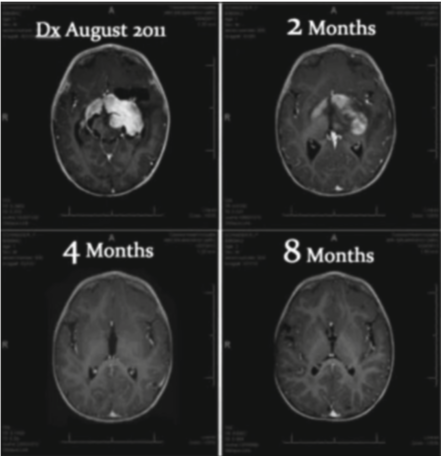

Image above: brain tumor size change over time (monitor the progression of
disease)

Image below: PET image and MR image (aligning two images of different modality of the same
patient)

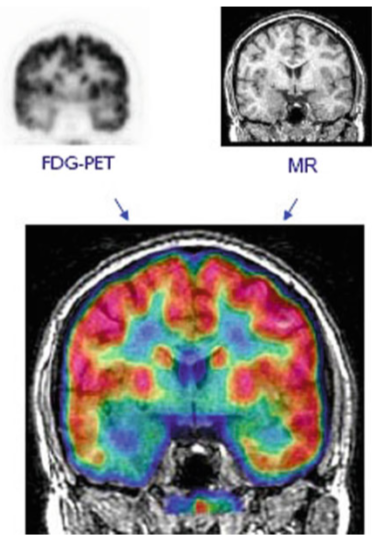

Some image are hard to registration, you may need to put physical landmark manually.

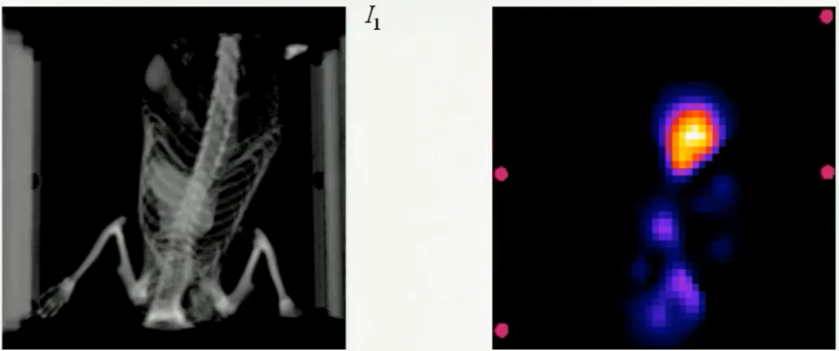

## Image registration component

1. defined objective function
2. defined transformation model
3. select optimization method
4. select interpolation method

## Features-based vs intensity-based

Features-based
- Features-based method try to find the transformation that minimize the distance between features that extracted from the images.
- Features-based are used when the **local informations** are importance than the information in the image intensities ( corners, edge).
- Usually local


Intensity-based
- amount of preprocessing or userinteraction required is usually less than point-based methods.
- search for the geometric transformation that, minimises or maximises a similarity measure (also known as cost function) between two image.
- Usually global

A methodology is classified as global, if all voxels presented in the region of the interest (ROI) are used. On the other hand, it is classified as local, if only a part of the voxels in the ROI is used.

### Features-based example

Registering aerial photos using point mapping (Manually).

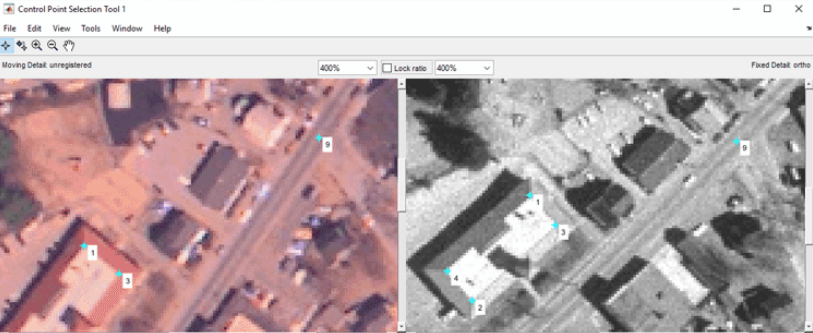

ref: https://www.mathworks.com/discovery/image-registration.html

Automatic registration using feature matching.

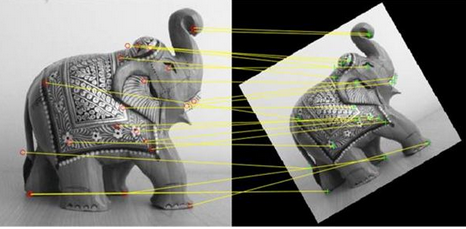

ref: https://www.mathworks.com/discovery/image-registration.html

### Intensity-based Example

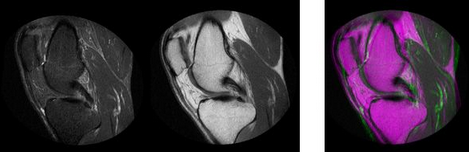

ref: https://www.mathworks.com/discovery/image-registration.html

## Features-based


Feature-based image registration involves identifying distinct features or landmarks in both the reference and floating images. These features can be points, lines, or shapes that are easily recognizable and consistent across both images. The registration process then involves finding the spatial transformation that aligns these features between the two images. I will only talk about

In features-based image registration a typical workflow would be

- Input fixed image and moving image
- Features extraction
    1. Detect keypoints
    2. Extract descriptor at keypoints
    3. Match keypoints
- calculate objective function (correspondence costs in figure) from matched points
- optimized the objective function to get transformation model.


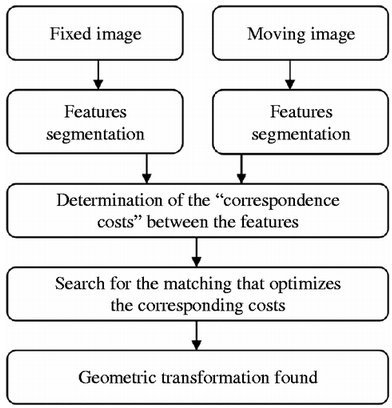

ref: https://doi.org/10.1080/10255842.2012.670855

### Harris Corner (Keypoint detection algorithm)

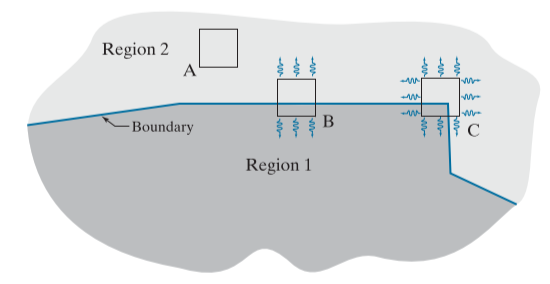

$$E = \sum_{x, y} w(x, y) [f(x+v, y+u) - f(x,y)]^2$$

Where $w(x, y )$ is weight function which can be
- 1 inside the patch and 0 elsewhere
- other function such as exponential function

After approximate by taylor expansion, the equation can be written in matrix form

$$E = \begin{bmatrix}
u & v
\end{bmatrix} M
\begin{bmatrix}
u \\
v
\end{bmatrix}$$

Where

$$M = \sum_{x,y} w(x, y)A$$

$$A = \begin{bmatrix}
f_x^2 & f_xf_y\\
f_xf_y & f_y^2
\end{bmatrix}$$

$f_x = ∂f/∂x, f_y = ∂f/∂y$

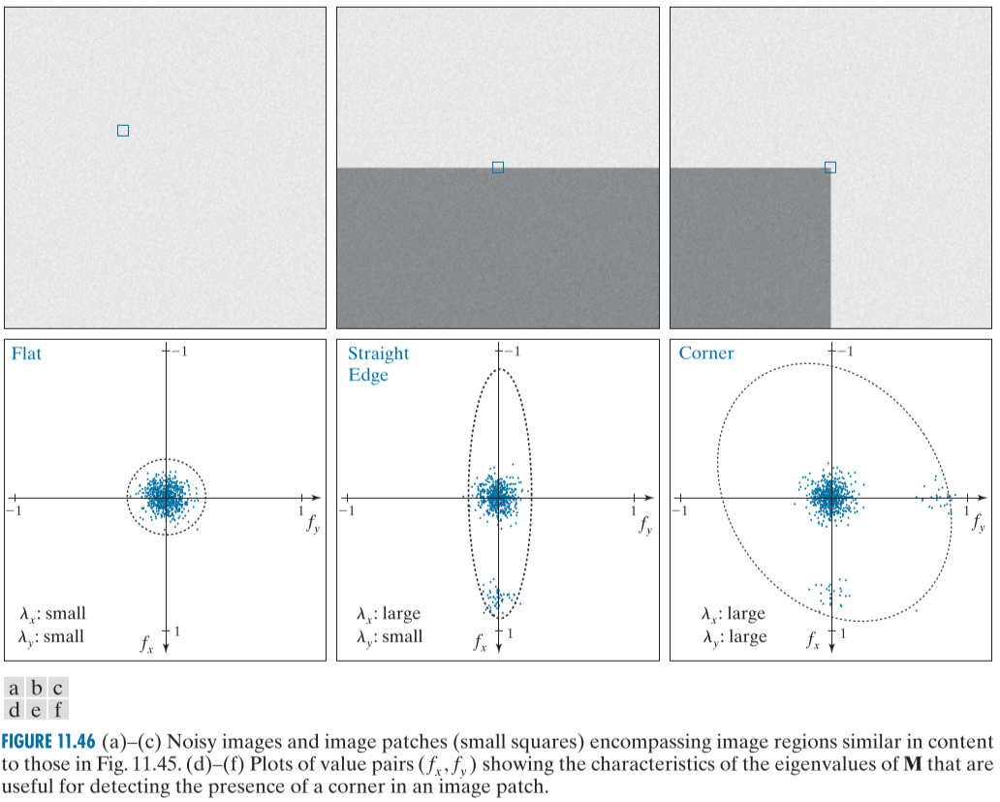

$$R = λ_1λ_2 - k (λ_1 + λ_2)^2 $$
$$R = \text{det}(M) - k \text{Tr}(M)^2 $$

You can interpret k as a “sensitivity factor;” the smaller it is, the more likely the detector is to find corners. $T$ here is the threshold

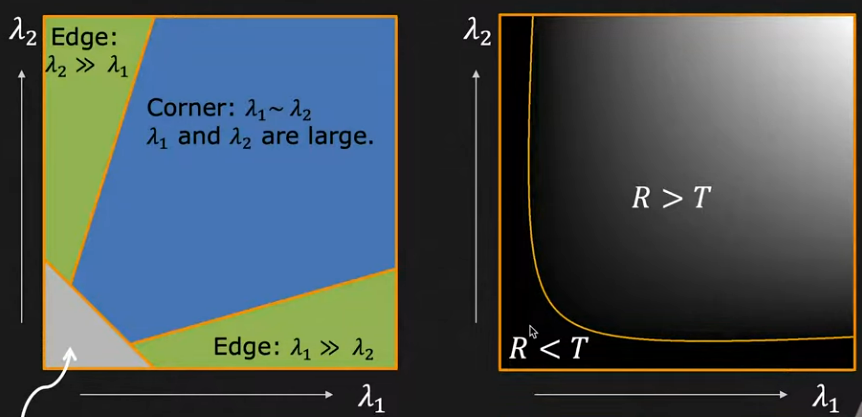

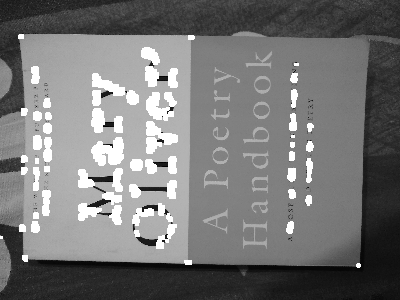

In [4]:

blockSize = 6 # - It is the size of neighbourhood considered for corner detection
ksize = 3 # - Aperture parameter of the Sobel derivative used.
k = 0.04 # Harris detector free parameter in the equation.

dst = cv2.cornerHarris(book,blockSize,ksize,k)
#result is dilated for marking the corners, not important
dst = cv2.dilate(dst,None)

T = 0.01*dst.max() # Threshold

ct_image_copy = deepcopy(book)
ct_image_copy[dst>T]=255
cv2_imshow(ct_image_copy)


### Scale-invariant feature transform (SIFT) (Keypoint detector and descriptor extraction algorithm)

For haris-conner detector the conner may not be the conner when image is scaled.

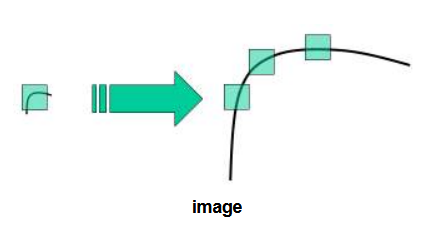

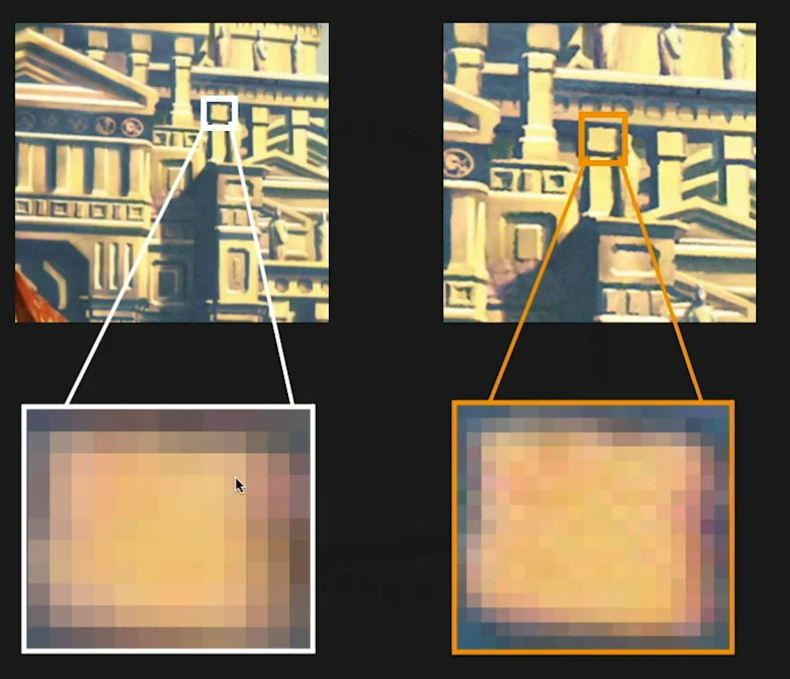

SIFT algorithm can extract features which invariant to scaling. SIFT also compute both keypoints and descriptor unlike harris-conner that compute only keypoints.

#### 1D keypoints detection

We try to find sigma that give local extrema in the normalized reponse signal

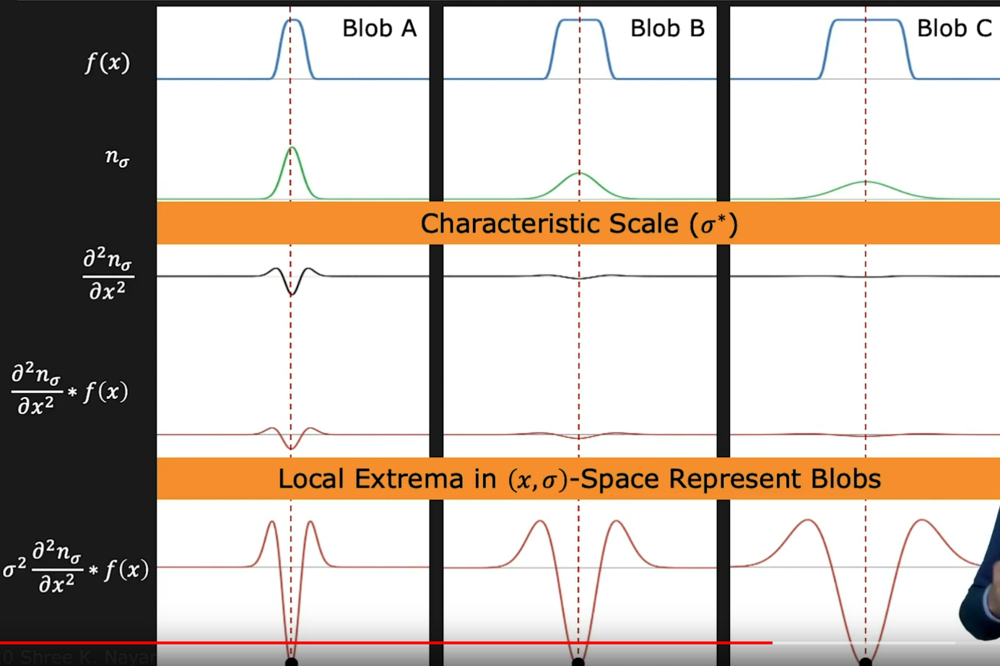

Objective


for 1d signal $f(x)$, find
$$ (x, σ) = argmax_{x, σ} |σ^2 \frac{∂^2n_σ}{∂x^2} * f(x) | $$

for $x$ is keypoint position and $\sigma$ is keypoint size



#### 2d keypoints detection

Using the same concept we find keypoints in 2D signal by

$$ (x, y, σ) = argmax_{x, y, σ} |σ^2 ∇^2n_σ * f(x, y) | $$

for $f(x,y)$ is pixel intensity

However, SIFT estimate the normalized response signal using calculation algorithm that more efficient than convolution.

**Difference of Gaussian (DoG)**

$$DoG = (n_{sσ} - n_σ) ≈ (s-1)σ^2 ∇^2 n_σ$$

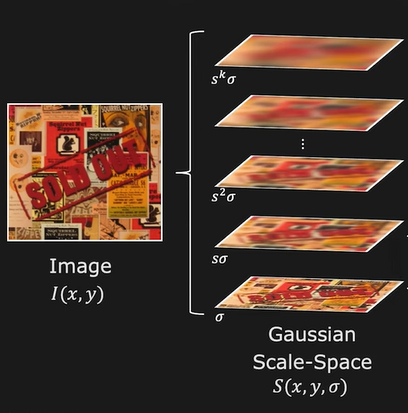

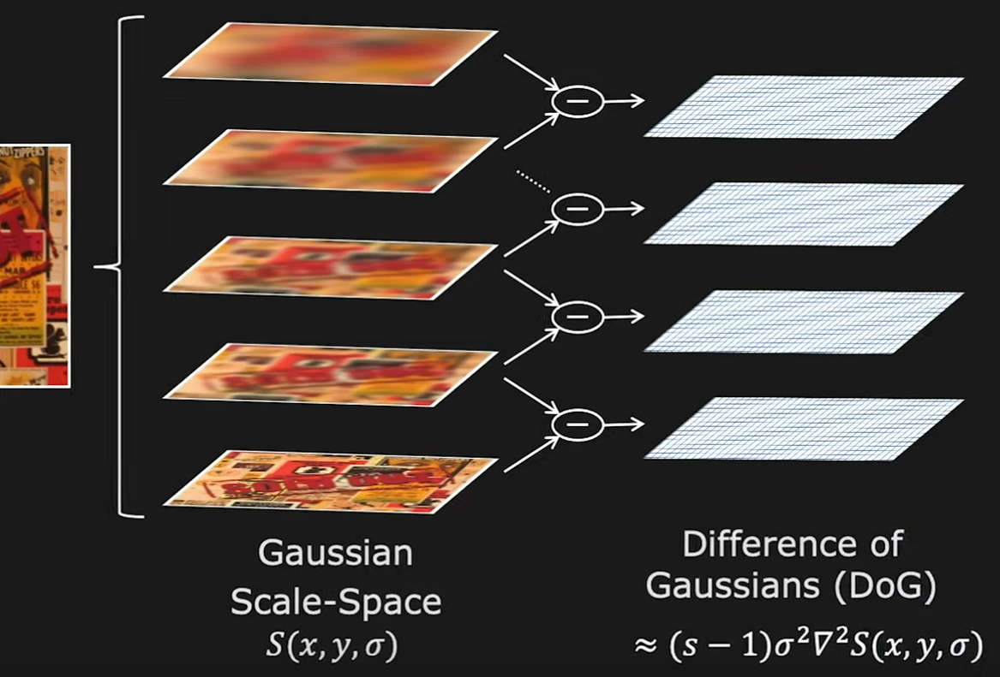

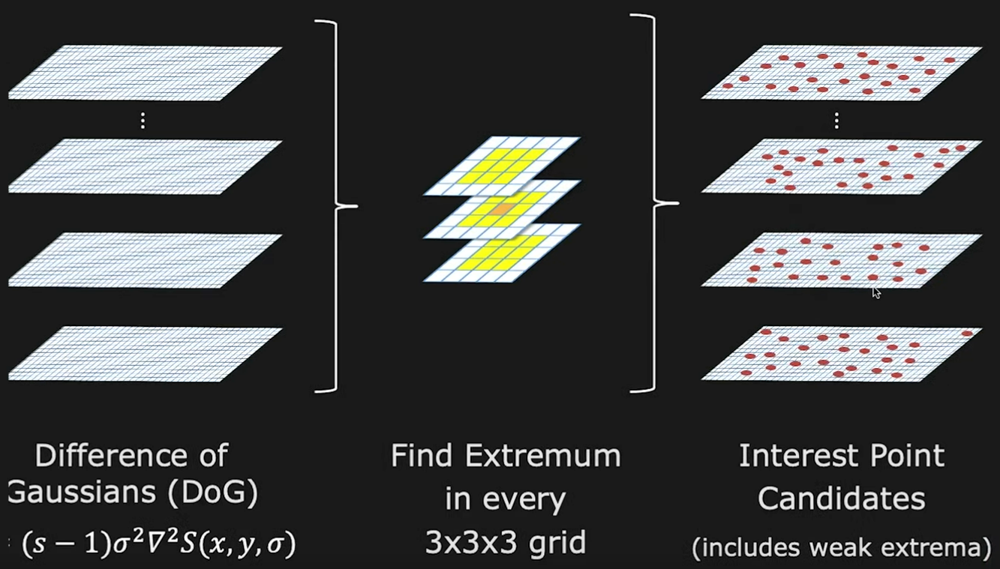

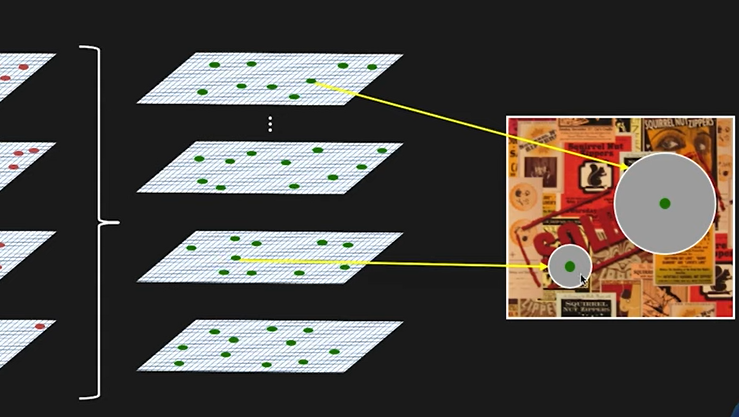

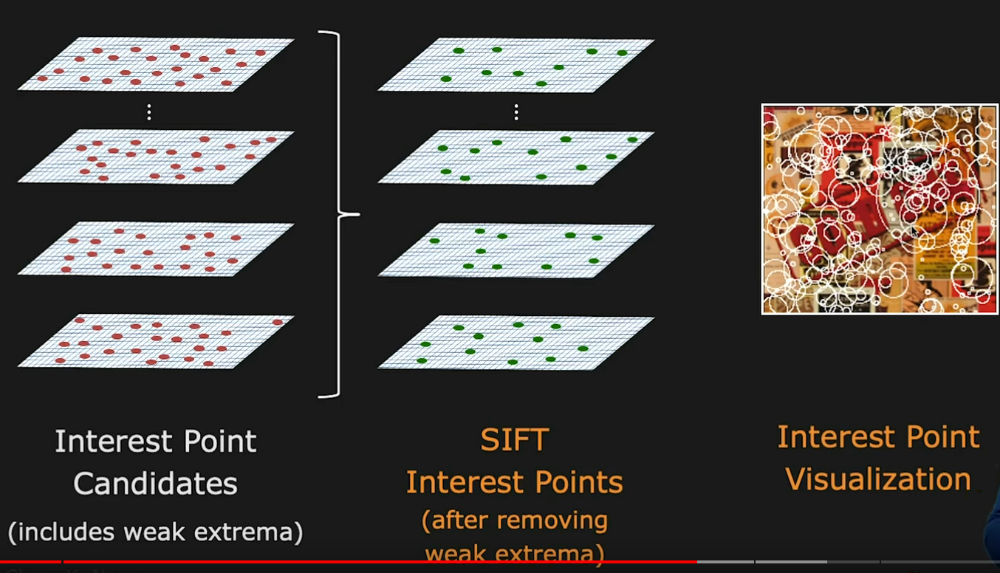

#### Descriptor

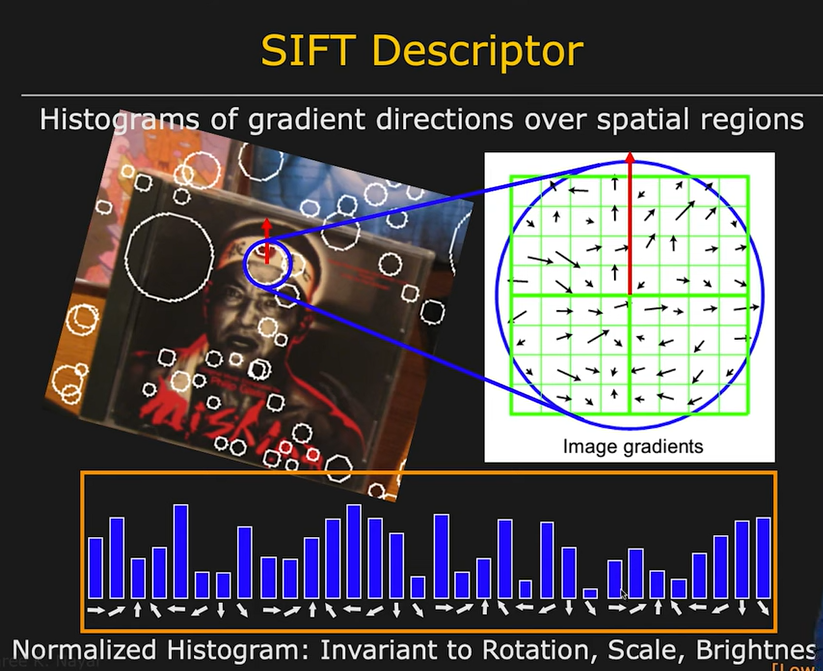

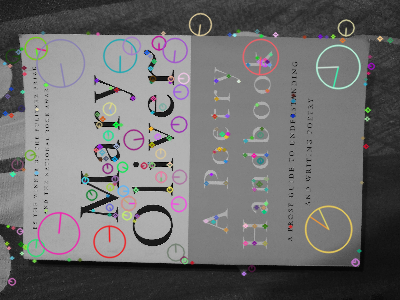

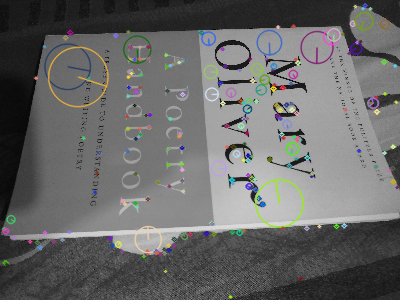

In [15]:
sift = cv2.xfeatures2d.SIFT_create()
keypoints, descriptors = sift.detectAndCompute(book, None)
moving_keypoints, moving_descriptors = sift.detectAndCompute(moving_book, None)

sift_image = cv2.drawKeypoints(book, keypoints, None, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# show the image
cv2_imshow(sift_image)
sift_image = cv2.drawKeypoints(moving_book, moving_keypoints, None, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# show the image
cv2_imshow(sift_image)

### Match keypoints

- Brute-Force Matcher: Brute-Force matcher is simple. It takes the descriptor of one feature in first set and is matched with all other features in second set using some distance calculation. And the closest one is returned. (cv2.BFMatcher)
- FLANN based Matcher: FLANN stands for Fast Library for Approximate Nearest Neighbors. It contains a collection of algorithms optimized for fast nearest neighbor search in large datasets and for high dimensional features. It works faster than BFMatcher for large datasets. We will see the second example with FLANN based matcher. (cv.FlannBasedMatcher)

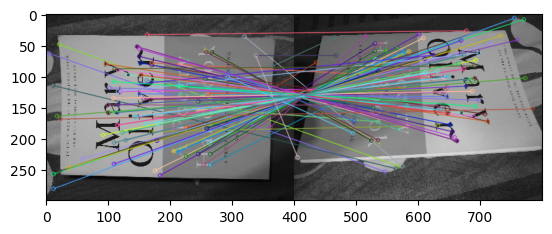

In [14]:
num_keypoints = 100

# Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck = True)

# Match two descriptor
matches = bf.match(descriptors, moving_descriptors)

# sort matching distance
matches = sorted(matches, key = lambda x : x.distance)

# use only some match
matches = matches[:num_keypoints]

result = cv2.drawMatches(book, keypoints, moving_book, moving_keypoints, matches, None, flags = 2)
plt.imshow(result)
plt.show()

### Objective function and optimization

#### Least square method

Given a set of matched points $\{ x_i, \hat{x_i} \}$ and a transformation $f$ with parameter $p$ for $x' = f(x;p)$, we want to minimized the sum of squared residuals.

$$E = \sum_i || f(x_i;p) - \hat{x_i} ||^2$$

$$E = \sum_i || r_i ||^2$$

for $r_i = f(x_i;p) - \hat{x_i}$



#### Robust least squares and RANSAC (Most common method)

Least square is the choice where noise follows a normal distribution. If the noise follow wide range of distribution,  it is preferable to use an M-estimator, which involves applying a robust penalty function ρ(r) to the residuals. We can write robust least square by the equation below.

$$E = \sum_i ρ(|| r_i ||)$$

One way to define function $ρ$ is introduce a weight function.

$$E = \sum_i w(||r_i||)|| r_i ||^2$$

The equation above is called iteratively reweighted least squares (IRLS).


While M-estimators can definitely help reduce the influence of outliers, in some cases, starting with too many outliers will prevent IRLS (or other gradient descent algorithms) from converging to
the global optimum. A better approved is to introduce another algorithm such as RANSAC which normally used in practice.

https://scikit-learn.org/stable/modules/linear_model.html#ransac-regression

In [ ]:
# Define empty matrices of shape no_of_matches * 2.
p1 = np.zeros((num_keypoints, 2))
p2 = np.zeros((num_keypoints, 2))

for i in range(len(matches)):
  p1[i, :] = keypoints[matches[i].queryIdx].pt
  p2[i, :] = moving_keypoints[matches[i].trainIdx].pt

# Find the homography matrix. document https://docs.opencv.org/3.4/d9/d0c/group__calib3d.html
homography, mask = cv2.findHomography(p2, p1, cv2.RANSAC)
(height, width) = moving_book.shape
# Use this matrix to transform the
# colored image wrt the reference image.
transformed_img = cv2.warpPerspective(moving_book,
                    homography, (width, height))
plt.imshow(transformed_img)
plt.show()
plt.imshow(book)
plt.show()

### ORB (Oriented FAST and Rotated BRIEF) (Keypoints detection and description extraction)

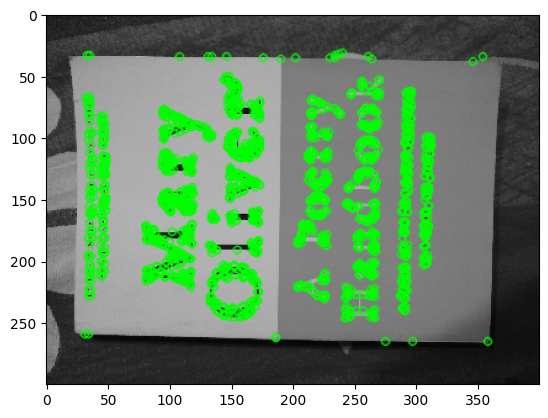

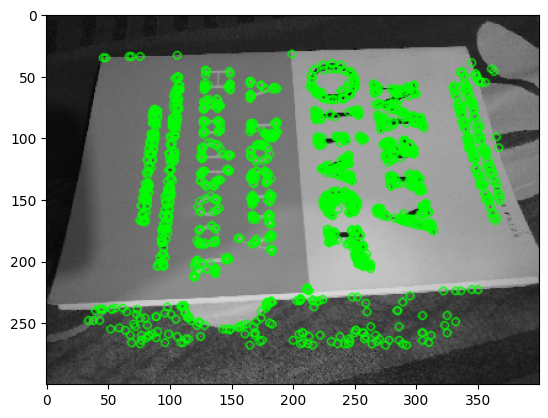

In [ ]:

orb_detector = cv2.ORB_create(5000)


book_keypoints, train_descriptor = orb_detector.detectAndCompute(book, None)
moving_book_keypoints, test_descriptor = orb_detector.detectAndCompute(moving_book, None)


key_train_image = np.copy(book)
key_train_image = cv2.drawKeypoints(book, book_keypoints, key_train_image, color = (0, 255, 0))

key_test_image = np.copy(moving_book)
key_test_image = cv2.drawKeypoints(moving_book, moving_book_keypoints, key_test_image, color = (0, 255, 0))


plt.imshow(key_train_image)
plt.show()
plt.imshow(key_test_image)
plt.show()

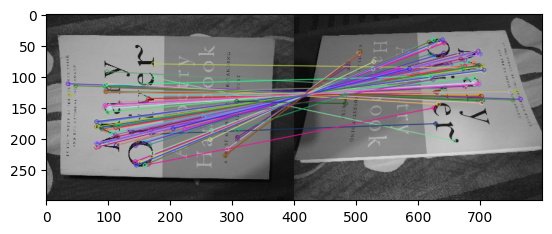

In [ ]:
num_keypoints = 100

# Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Match two descriptor
matches = bf.match(train_descriptor, test_descriptor)

# sort matching distance
matches = sorted(matches, key = lambda x : x.distance)

# use only some match
matches = matches[:num_keypoints]

result = cv2.drawMatches(book, book_keypoints, moving_book, moving_book_keypoints, matches, img, flags = 2)
plt.imshow(result)
plt.show()

## Intensity-based registration

Intensity-based image registration is a type of image registration that focuses on aligning the intensity patterns in the images, rather than distinct features or landmarks. The core idea behind intensity-based registration is to find the spatial transformation that maximizes the similarity between the intensity patterns in the reference and floating images.

https://simpleitk.readthedocs.io/en/master/registrationOverview.html

https://simpleitk.readthedocs.io/en/master/link_examples.html

https://readthedocs.org/projects/simpleitk/downloads/pdf/release/

What you need to defined:

1. Transformation.
2. Interpolator.
3. Similarity metric.
4. Optimizer.

### Note: Landmark-based registration in SimpleITK

SimpleITK also have landmark-based registration which using Least-square method by default.

https://simpleitk.readthedocs.io/en/master/link_LandmarkRegistration_docs.html


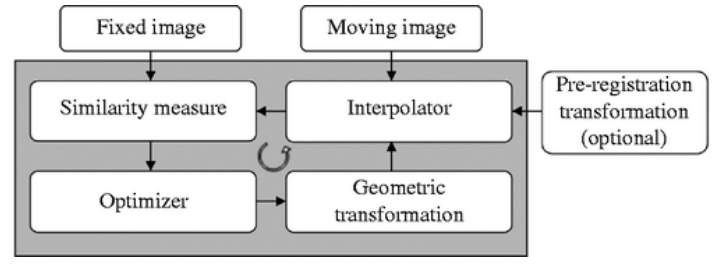

ref: https://doi.org/10.1080/10255842.2012.670855

### Similarity metrics (Objective function)

Compare to machine learning, you can view this as **loss function**.




#### least square

Sum of Squared Differences (SSD) is a similarity metric that measures the difference between the intensity values in the reference and floating images. SSD is a simple and fast similarity metric to calculate, but it can be sensitive to noise and artifacts. It is also not suitable for images with non-linear transformations.

#### Correlation

Cross-Correlation (CC) is another widely used similarity metric in intensity-based image registration. It measures the similarity between the intensity patterns in the reference and floating images. CC is a simple and fast similarity metric to calculate, but it can be sensitive to noise and artifacts (CC is more robust to noise and artifacts than SSD). It is also not suitable for images with non-linear transformations (CC is more suitable for handling non-linear transformations than SSD).

$$
CC ={\frac {\sum _{m,n}[f(m,n)-{\bar {f}}][g(m,n)-{\bar {g}}]}{\sqrt {\sum _{m,n}{[f(m,n)-{\bar {f}}]^{2}}\sum _{m,n}{[g(m,n)-{\bar {g}}]^{2}}}}}.
$$

for $f(m,n)$ and $g(m,n)$ is image intensity of image $f$ and image $g$ at point $m$, $n$.

#### **Mutual Information**





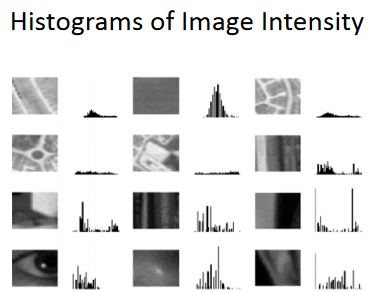

Mutual Information (MI) measures the statistical dependence between the reference and floating images. MI is based on the concept of entropy, which quantifies the amount of uncertainty or randomness in a probability distribution.

$$MI(f;g)=∑_{f,g} P(f,g) × log \frac{P(f,g)}{P(f)P(g)}$$

For $f$, $g$ is image intensity. The above equation is sum for all possible pair of intensity values. $P(f)$ and $P(g)$ is marginal probability for the intensity value of image $f$ and $g$, respectively. $P(f,g)$ is joint probability of intensity value in both images.

MI is a robust similarity metric that can handle non-linear transformations and is insensitive to noise and artifacts. However, it can be computationally expensive to calculate, especially for large images.

### Transformation (Deformation model) and Interpolator

Compare to machine learning you can view this as **model**.

- Rigid transformation
- Similarity transformation
- Affine transformation
- Non-linear transformation: B-Spline, Displacement field

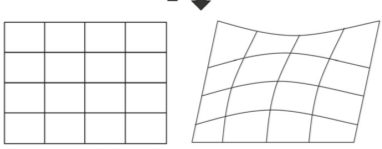

### Coding

#### Getting data

(256, 256) (256, 256)


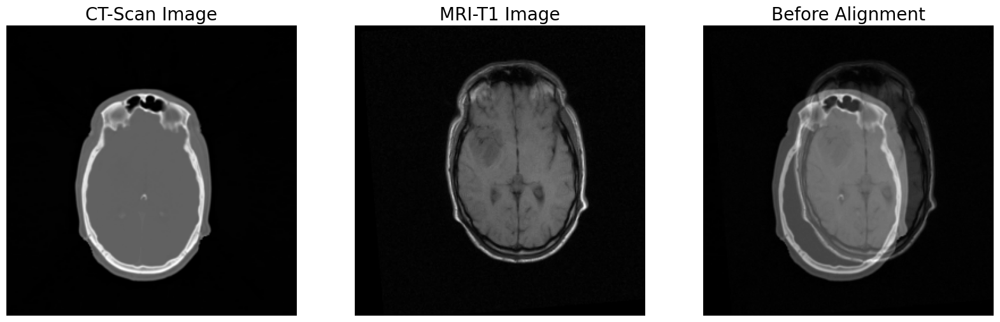

In [ ]:
import SimpleITK as sitk
import numpy as np
import matplotlib.pyplot as plt

fixed_image =  sitk.ReadImage("data/ct_scan_11.jpg", sitk.sitkFloat32)
moving_image = sitk.ReadImage("data/mr_T1_06.jpg", sitk.sitkFloat32)

fixed_image_array = sitk.GetArrayFromImage(fixed_image)
moving_image_array = sitk.GetArrayFromImage(moving_image)
print(fixed_image_array.shape, moving_image_array.shape)
plt.figure(figsize=(20,10))
plt.gray()
plt.subplot(131), plt.imshow(fixed_image_array), plt.axis('off'), plt.title('CT-Scan Image', size=20)
plt.subplot(132), plt.imshow(moving_image_array), plt.axis('off'), plt.title('MRI-T1 Image', size=20)
plt.subplot(133), plt.imshow(0.6*fixed_image_array + 0.4*moving_image_array), plt.axis('off'), plt.title('Before Alignment', size=20)
plt.show()

#### Preregistration

(256, 256) (256, 256)


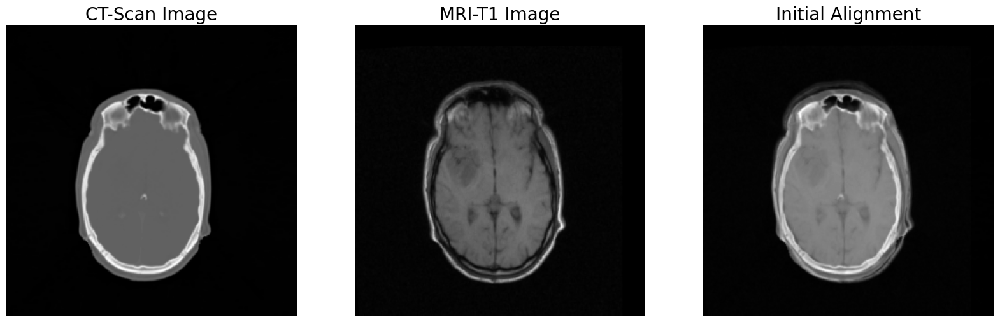

itk::simple::Transform
 Similarity2DTransform (0x3cf1690)
   RTTI typeinfo:   itk::Similarity2DTransform<double>
   Reference Count: 1
   Modified Time: 2482
   Debug: Off
   Object Name: 
   Observers: 
     none
   Matrix: 
     1 -0 
     0 1 
   Offset: [20.1729, -17.7453]
   Center: [121.112, 141.404]
   Translation: [20.1729, -17.7453]
   Inverse: 
     1 0 
     0 1 
   Singular: 0
   Angle       = 0
   Scale =1



In [ ]:


initial_transform = sitk.CenteredTransformInitializer(fixed_image,
                                                      moving_image,
                                                      sitk.Similarity2DTransform())
interpolator = sitk.sitkLinear
default_pixel = 0.0
moving_resampled = sitk.Resample(moving_image, fixed_image, initial_transform, interpolator, default_pixel, moving_image.GetPixelID())

fixed_image_array = sitk.GetArrayFromImage(fixed_image)
moving_image_array = sitk.GetArrayFromImage(moving_resampled)
print(fixed_image_array.shape, moving_image_array.shape)
plt.figure(figsize=(20,10))
plt.gray()
plt.subplot(131), plt.imshow(fixed_image_array), plt.axis('off'), plt.title('CT-Scan Image', size=20)
plt.subplot(132), plt.imshow(moving_image_array), plt.axis('off'), plt.title('MRI-T1 Image', size=20)
plt.subplot(133), plt.imshow(0.6*fixed_image_array + 0.4*moving_image_array), plt.axis('off'), plt.title('Initial Alignment', size=20)
plt.show()

print(initial_transform)

#### Registration

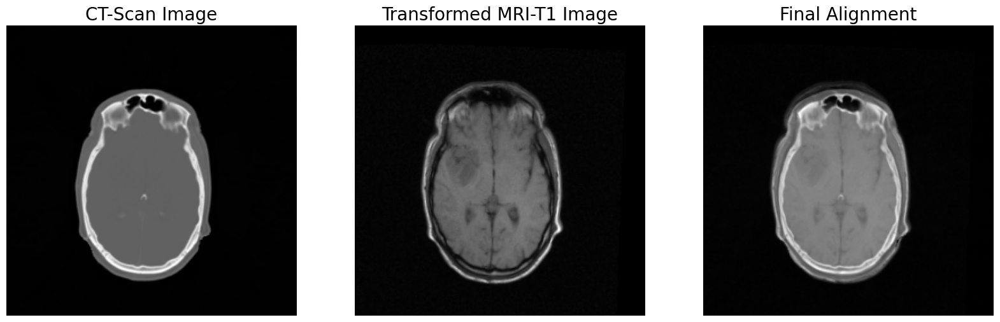

itk::simple::CompositeTransform
 CompositeTransform (0x3e0cd00)
   RTTI typeinfo:   itk::CompositeTransform<double, 2u>
   Reference Count: 1
   Modified Time: 29777
   Debug: Off
   Object Name: 
   Observers: 
     none
   Transforms in queue, from begin to end:
   >>>>>>>>>
   Euler2DTransform (0x44dbc20)
     RTTI typeinfo:   itk::Euler2DTransform<double>
     Reference Count: 1
     Modified Time: 29623
     Debug: Off
     Object Name: 
     Observers: 
       none
     Matrix: 
       0.999339 0.0363535 
       -0.0363535 0.999339 
     Offset: [16.2656, -13.6803]
     Center: [0, 0]
     Translation: [16.2656, -13.6803]
     Inverse: 
       0.999339 -0.0363535 
       0.0363535 0.999339 
     Singular: 0
     Angle       = -0.0363615
   End of MultiTransform.
<<<<<<<<<<
   TransformsToOptimizeFlags, begin() to end(): 
      1 
   TransformsToOptimize in queue, from begin to end:
   End of TransformsToOptimizeQueue.
<<<<<<<<<<
   End of CompositeTransform.
<<<<<<<<<<



In [ ]:

# https://buildmedia.readthedocs.org/media/pdf/simpleitk/master/simpleitk.pdf

registration_method = sitk.ImageRegistrationMethod()

## Similarity metric settings.
# registration_method.SetMetricAsMeanSquares()
registration_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)

# registration_method.SetMetricSamplingStrategy(registration_method.RANDOM)
# registration_method.SetMetricSamplingPercentage(0.01)

# set interpolator
registration_method.SetInterpolator(sitk.sitkLinear)

# Optimizer settings.
registration_method.SetOptimizerAsGradientDescent(learningRate=1.0, numberOfIterations=100, convergenceMinimumValue=1e-6, convergenceWindowSize=10)
registration_method.SetOptimizerScalesFromPhysicalShift()

# # Setup for the multi-resolution framework.
# registration_method.SetShrinkFactorsPerLevel(shrinkFactors = [4,2,1])
# registration_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[2,1,0])
# registration_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()


# registration_method.SetInitialTransform(sitk.TranslationTransform(2), inPlace=False)
# registration_method.SetInitialTransform(sitk.Euler2DTransform(), inPlace=False)
registration_method.SetInitialTransform(initial_transform, inPlace=False)

# Connect all of the observers so that we can perform plotting during registration.
final_transform = registration_method.Execute(sitk.Cast(fixed_image, sitk.sitkFloat32),
                                               sitk.Cast(moving_image, sitk.sitkFloat32))

default_pixel = 0.0
out = sitk.Resample(moving_image, fixed_image, final_transform, sitk.sitkLinear, default_pixel, moving_image.GetPixelID())
moving_image_array = sitk.GetArrayFromImage(out)

plt.figure(figsize=(20,10))
plt.gray()
plt.subplot(131), plt.imshow(fixed_image_array), plt.axis('off'), plt.title('CT-Scan Image', size=20)
plt.subplot(132), plt.imshow(moving_image_array), plt.axis('off'), plt.title('Transformed MRI-T1 Image', size=20)
plt.subplot(133), plt.imshow(0.6*fixed_image_array + 0.4*moving_image_array), plt.axis('off'), plt.title('Final Alignment', size=20)
plt.show()

print(final_transform)

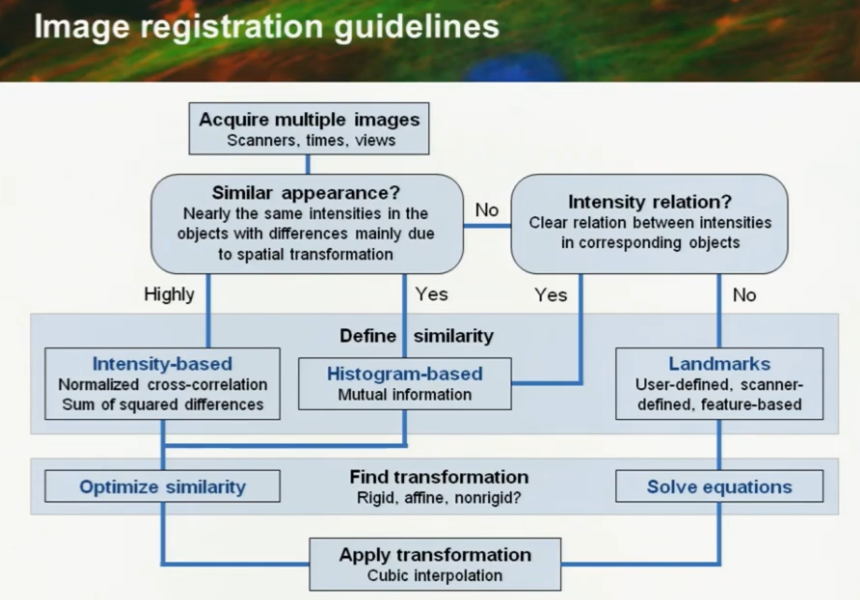

Guideline references

Watch example application

https://www.youtube.com/watch?v=ecu8kreTwYM